Event No: 1, ADC integral: 106
Event No: 1, ADC integral: 361
Event No: 1, ADC integral: 1362
Event No: 1, ADC integral: 4831
Event No: 1, ADC integral: 3320
Event No: 1, ADC integral: 2861
Event No: 1, ADC integral: 1981
Event No: 1, ADC integral: 3957
Event No: 1, ADC integral: 22176
Event No: 1, ADC integral: 7423
Event No: 1, ADC integral: 7764
Event No: 1, ADC integral: 6763
Event No: 1, ADC integral: 4606
Event No: 1, ADC integral: 3497
Event No: 1, ADC integral: 3812
Event No: 1, ADC integral: 3582
Event No: 1, ADC integral: 3493
Event No: 1, ADC integral: 2130
Event No: 1, ADC integral: 1462
Event No: 1, ADC integral: 1600
Event No: 1, ADC integral: 2009
Event No: 1, ADC integral: 1615
Event No: 1, ADC integral: 1746
Event No: 1, ADC integral: 3697
Event No: 1, ADC integral: 1712
Event No: 1, ADC integral: 1478
Event No: 1, ADC integral: 1509
Event No: 1, ADC integral: 1477
Event No: 1, ADC integral: 1670
Event No: 1, ADC integral: 1313
Event No: 1, ADC integral: 1327
Event No:

Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas


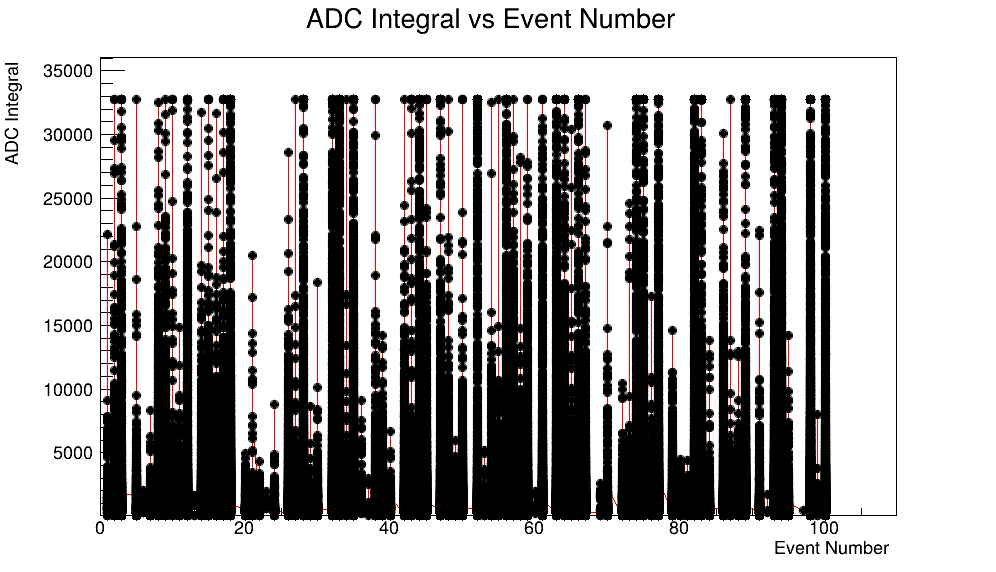

In [18]:
import ROOT

# Open the ROOT file
g = ROOT.TFile("~/Downloads/analysis_hist_1003MeV_pimu.root", "READ")

# Create a canvas
canvas = ROOT.TCanvas("canvas", "canvas", 1000, 600)

# Get the directory and tree
dir1 = g.Get("offlineTriggerTPCInfoDisplay")

# Ensure the directory is retrieved
if not dir1:
    print("Directory 'offlineTriggerTPCInfoDisplay' not found.")
else:
    tree = dir1.Get("TPTree")
    graph = ROOT.TGraph()
        
        # Loop over entries and fill the graph
    for i in range(min(tree.GetEntries(), 265362)):  # Adjust the range as needed
            tree.GetEntry(i)
            
            # Assuming Event is an integer branch and ADC_integral is a float branch
            event_number = getattr(tree, "Event")
            adc_value = getattr(tree, "ADC_integral")
            
            graph.SetPoint(i, event_number, adc_value)
            print(f"Event No: {event_number}, ADC integral: {adc_value}")
        
        # Set graph titles and labels
    graph.SetTitle("ADC Integral vs Event Number")
    graph.GetXaxis().SetTitle("Event Number")
    graph.GetYaxis().SetTitle("ADC Integral")
    graph.SetMarkerStyle(20)
    graph.SetLineColor(2)
        
        # Draw the graph
    graph.Draw("APL")
    canvas.Draw()


Event No: 1, ADC sum: 504381
Event No: 2, ADC sum: 4121733
Event No: 3, ADC sum: 4956322
Event No: 5, ADC sum: 1644327
Event No: 6, ADC sum: 16676
Event No: 7, ADC sum: 654329
Event No: 8, ADC sum: 10184622
Event No: 9, ADC sum: 5269354
Event No: 10, ADC sum: 1000215
Event No: 11, ADC sum: 1342327
Event No: 12, ADC sum: 10663006
Event No: 13, ADC sum: 4263
Event No: 14, ADC sum: 4195237
Event No: 15, ADC sum: 6029288
Event No: 16, ADC sum: 2952090
Event No: 17, ADC sum: 7619427
Event No: 18, ADC sum: 28418845
Event No: 20, ADC sum: 660695
Event No: 21, ADC sum: 699940
Event No: 22, ADC sum: 205677
Event No: 23, ADC sum: 10118
Event No: 24, ADC sum: 340390
Event No: 26, ADC sum: 5603490
Event No: 27, ADC sum: 1232162
Event No: 28, ADC sum: 18605514
Event No: 29, ADC sum: 407600
Event No: 30, ADC sum: 1414454
Event No: 32, ADC sum: 11483316
Event No: 33, ADC sum: 29923753
Event No: 34, ADC sum: 644195
Event No: 35, ADC sum: 22335574
Event No: 36, ADC sum: 151032
Event No: 37, ADC sum: 11

Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas


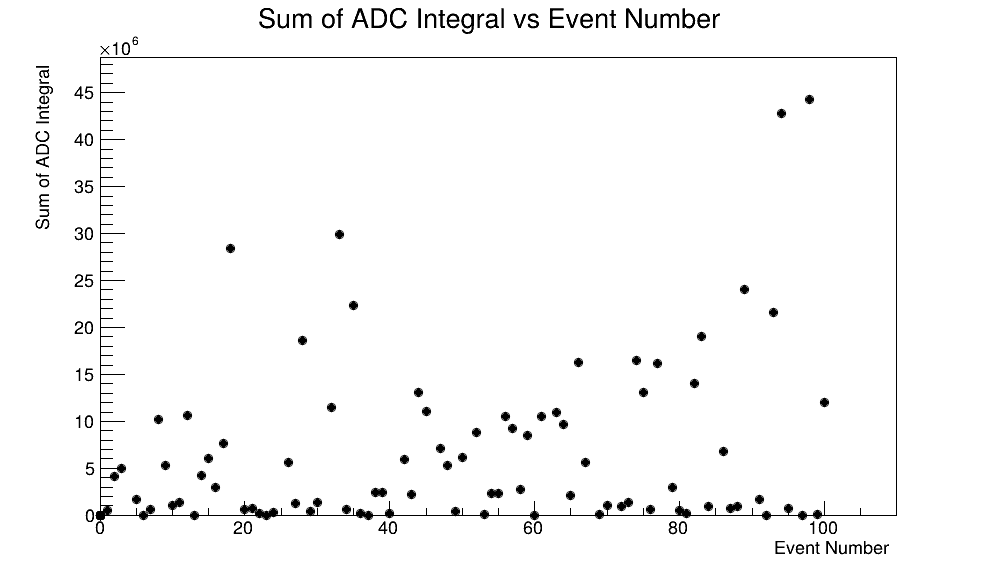

In [26]:
#  code to sum the adc values for each event
g = ROOT.TFile("~/Downloads/analysis_hist_1003MeV_pimu.root", "READ")

# Create a canvas
canvas = ROOT.TCanvas("canvas", "canvas", 1000, 600)

# Get the directory and tree
dir1 = g.Get("offlineTriggerTPCInfoDisplay")
tree = dir1.Get("TPTree")
graph = ROOT.TGraph()

sums = {}
for i in range(min(tree.GetEntries(), 265362)):  # Adjust the range as needed
    tree.GetEntry(i)
    event_number = getattr(tree, "Event")
    adc_value = getattr(tree, "ADC_integral")
    if event_number not in sums:
        sums[event_number] = 0
    sums[event_number] += adc_value

# Print the sums
for event_number, adc_sum in sums.items():
    print(f"Event No: {event_number}, ADC sum: {adc_sum}")
    

#plotting the sum of adc values for each event
graph2 = ROOT.TGraph()
for event_number, adc_sum in sums.items():
    graph2.SetPoint(event_number, event_number, adc_sum)


graph2.SetTitle("Sum of ADC Integral vs Event Number")
graph2.GetXaxis().SetTitle("Event Number")
graph2.GetYaxis().SetTitle("Sum of ADC Integral")
graph2.SetMarkerStyle(20)
graph2.SetLineColor(2)

graph2.Draw("AP")
canvas.Draw()

#get minimum and maximum adc sum values with corresponding event numbers
min_adc_sum = min(sums.values())
max_adc_sum = max(sums.values())
print(f"Minimum ADC sum: {min_adc_sum}, Event No: {list(sums.keys())[list(sums.values()).index(min_adc_sum)]}")
print(f"Maximum ADC sum: {max_adc_sum}, Event No: {list(sums.keys())[list(sums.values()).index(max_adc_sum)]}")



Event No: 1, Energy sum: 12.545800275347887
Event No: 2, Energy sum: 66.49213529108795
Event No: 3, Energy sum: 66.49213529108795
Event No: 4, Energy sum: 26.792475320066544
Event No: 5, Energy sum: 26.792475320066544
Event No: 6, Energy sum: 94.72726842870429
Event No: 7, Energy sum: 116.82192277317193
Event No: 8, Energy sum: 31.896342015312403
Event No: 9, Energy sum: 29.972277210552853
Event No: 10, Energy sum: 29.972277210552853
Event No: 11, Energy sum: 18.30329206419443
Event No: 12, Energy sum: 18.30329206419443
Event No: 13, Energy sum: 12.16329819180697
Event No: 14, Energy sum: 32.63484908719606
Event No: 15, Energy sum: 32.63484908719606
Event No: 16, Energy sum: 32.63484908719606
Event No: 17, Energy sum: 50.34317021677115
Event No: 18, Energy sum: 50.34317021677115
Event No: 19, Energy sum: 41.50229945897138
Event No: 20, Energy sum: 107.05094063561721
Event No: 21, Energy sum: 107.05094063561721
Event No: 22, Energy sum: 107.05094063561721
Event No: 23, Energy sum: 107.0

Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas


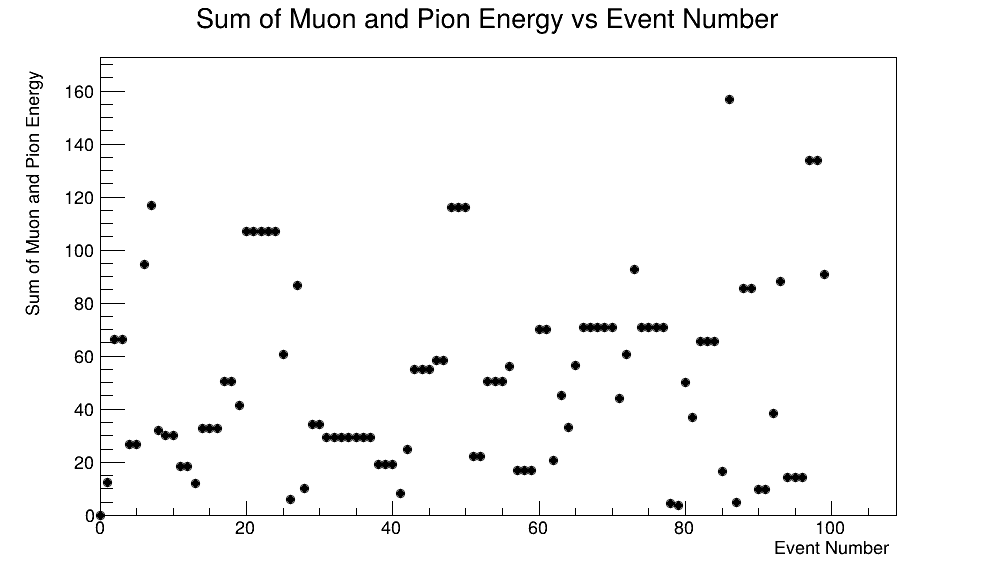

In [29]:
import ROOT
file2 = ROOT.TFile("root_files/proto_hist_8July_1433_1003MeV_pimu.root", "READ")
dir2 = file2.Get("ana")
tree2 = dir2.Get("treeHNLsel")
branch_Mu = tree2.GetBranch("EMu")
branch_Pi = tree2.GetBranch("EPi")

#plot the dedex event by event
canvas = ROOT.TCanvas("canvas", "canvas", 1000, 600)

graph2 = ROOT.TGraph()

#plot the sum of muon and pion energy for each event by event
sums = {}
for i in range(min(tree2.GetEntries(), 265362)):  # Adjust the range as needed
    tree2.GetEntry(i)
    event_number = i
    muon_energy = getattr(tree2, "EMu")
    pion_energy = getattr(tree2, "EPi")
    if event_number not in sums:
        sums[event_number] = 0
    sums[event_number] += muon_energy + pion_energy
del sums[0]
# Print the sums
for event_number, energy_sum in sums.items():
    print(f"Event No: {event_number}, Energy sum: {energy_sum}")

graph2 = ROOT.TGraph()
for event_number, energy_sum in sums.items():
    graph2.SetPoint(event_number, event_number, energy_sum)

graph2.SetTitle("Sum of Muon and Pion Energy vs Event Number")
graph2.GetXaxis().SetTitle("Event Number")
graph2.GetYaxis().SetTitle("Sum of Muon and Pion Energy")
graph2.SetMarkerStyle(20)
graph2.SetLineColor(2)

graph2.Draw("AP")
canvas.Draw()

#get minimum and maximum energy sum values with corresponding event numbers
#do not include the event number 0

min_energy_sum = min(sums.values())
max_energy_sum = max(sums.values())
print(f"Minimum Energy sum: {min_energy_sum}, Event No: {list(sums.keys())[list(sums.values()).index(min_energy_sum)]}")
print(f"Maximum Energy sum: {max_energy_sum}, Event No: {list(sums.keys())[list(sums.values()).index(max_energy_sum)]}")

# Adc and energy vs event number

Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas


Event No: 1, ADC sum: 504381, Energy sum: 12.545800275347887
Event No: 2, ADC sum: 4121733, Energy sum: 66.49213529108795
Event No: 3, ADC sum: 4956322, Energy sum: 66.49213529108795
Event No: 5, ADC sum: 1644327, Energy sum: 26.792475320066544
Event No: 6, ADC sum: 16676, Energy sum: 94.72726842870429
Event No: 7, ADC sum: 654329, Energy sum: 116.82192277317193
Event No: 8, ADC sum: 10184622, Energy sum: 31.896342015312403
Event No: 9, ADC sum: 5269354, Energy sum: 29.972277210552853
Event No: 10, ADC sum: 1000215, Energy sum: 29.972277210552853
Event No: 11, ADC sum: 1342327, Energy sum: 18.30329206419443
Event No: 12, ADC sum: 10663006, Energy sum: 18.30329206419443
Event No: 13, ADC sum: 4263, Energy sum: 12.16329819180697
Event No: 14, ADC sum: 4195237, Energy sum: 32.63484908719606
Event No: 15, ADC sum: 6029288, Energy sum: 32.63484908719606
Event No: 16, ADC sum: 2952090, Energy sum: 32.63484908719606
Event No: 17, ADC sum: 7619427, Energy sum: 50.34317021677115
Event No: 18, A

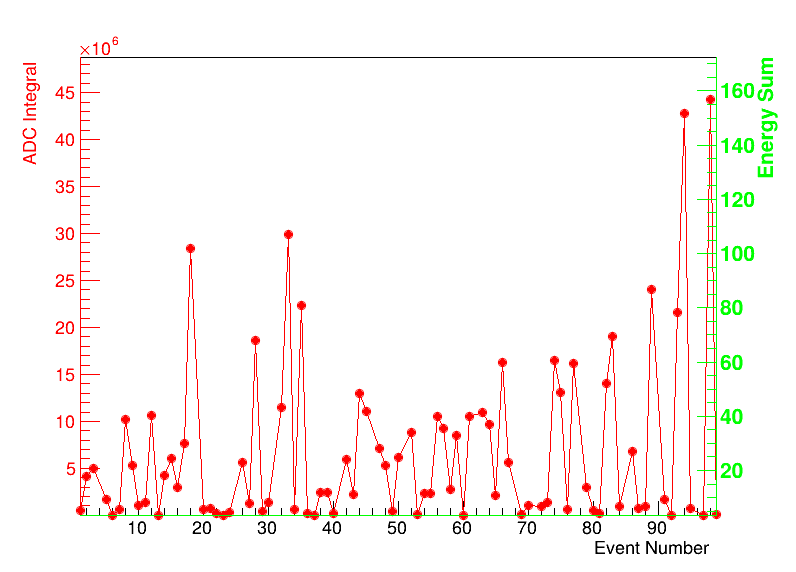

In [1]:
#Now, for the events that are common in both the files, plot the energy from hepmc file and adc integral from analysis file
import ROOT
# Open the ROOT file
g = ROOT.TFile("~/Downloads/analysis_hist_1003MeV_pimu.root", "READ")
canvas = ROOT.TCanvas("canvas", "canvas", 1000, 600)
dir1 = g.Get("offlineTriggerTPCInfoDisplay")
tree = dir1.Get("TPTree")

file2 = ROOT.TFile("root_files/proto_hist_8July_1433_1003MeV_pimu.root", "READ")
dir2 = file2.Get("ana")
tree2 = dir2.Get("treeHNLsel")
branch_Mu = tree2.GetBranch("EMu")
branch_Pi = tree2.GetBranch("EPi")

# y axis : adc and energy sum  
# x axis : event number

sums = {}
for i in range(min(tree.GetEntries(), 265362)):  # Adjust the range as needed
    tree.GetEntry(i)
    event_number = getattr(tree, "Event")
    adc_value = getattr(tree, "ADC_integral")
    if event_number not in sums:
        sums[event_number] = 0
    sums[event_number] += adc_value

sums2 = {}
for i in range(min(tree2.GetEntries(), 265362)):  # Adjust the range as needed
    tree2.GetEntry(i)
    event_number = i
    muon_energy = getattr(tree2, "EMu")
    pion_energy = getattr(tree2, "EPi")
    if event_number not in sums2:
        sums2[event_number] = 0
    sums2[event_number] += muon_energy + pion_energy

common_events = set(sums.keys()).intersection(set(sums2.keys()))


canvas = ROOT.TCanvas("canvas", "Canvas with two y-axes", 800, 600)

# Create the individual graphs
graph1 = ROOT.TGraph()
graph2 = ROOT.TGraph()

# Add points to the graphs
for idx, event_number in enumerate(common_events):
    graph1.SetPoint(idx, event_number, sums[event_number])
    graph2.SetPoint(idx, event_number, sums2[event_number])

#print the energy sum and adc integral for the common events
for idx, event_number in enumerate(common_events):
    print(f"Event No: {event_number}, ADC sum: {sums[event_number]}, Energy sum: {sums2[event_number]}")

# Set marker styles and colors
graph1.SetMarkerStyle(20)
graph1.SetLineColor(2)
graph1.SetMarkerColor(2)
graph2.SetMarkerStyle(21)
graph2.SetLineColor(3)
graph2.SetMarkerColor(3)

# Draw the first graph
graph1.Draw("APL")

# Configure the primary y-axis
graph1.GetYaxis().SetTitle("ADC Integral")
graph1.GetYaxis().SetTitleColor(2)
graph1.GetYaxis().SetLabelColor(2)
graph1.GetYaxis().SetAxisColor(2)
graph1.GetXaxis().SetTitle("Event Number")

# Set the range of the x-axis to match the common events
graph1.GetXaxis().SetLimits(min(common_events), max(common_events))

# Update the canvas to draw the first graph
canvas.Modified()
canvas.Update()

# Create a secondary y-axis
right_axis = ROOT.TGaxis(ROOT.gPad.GetUxmax(), ROOT.gPad.GetUymin(),
                         ROOT.gPad.GetUxmax(), ROOT.gPad.GetUymax(),
                         3.5, graph2.GetHistogram().GetMaximum(),
                         510, "+L")
right_axis.SetTitle("Energy Sum")
right_axis.SetTitleColor(3)
right_axis.SetLabelColor(3)
right_axis.SetLineColor(3)
right_axis.SetTextColor(3)
right_axis.Draw()

print(f"Common events: {len(common_events)}")

graph2.Draw("PLSAME")

# Update the canvas
canvas.Modified()
canvas.Update()
canvas.Draw()


Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas


Common events: 85
Scale factor: 282336.9609307671
Event No: 1, ADC sum: 504381, Energy sum: 12.545800275347887, Scaled Energy sum: 3542143.122186104
Event No: 2, ADC sum: 4121733, Energy sum: 66.49213529108795, Scaled Energy sum: 18773187.403883178
Event No: 3, ADC sum: 4956322, Energy sum: 66.49213529108795, Scaled Energy sum: 18773187.403883178
Event No: 5, ADC sum: 1644327, Energy sum: 26.792475320066544, Scaled Energy sum: 7564506.05768017
Event No: 6, ADC sum: 16676, Energy sum: 94.72726842870429, Scaled Energy sum: 26745009.085433375
Event No: 7, ADC sum: 654329, Energy sum: 116.82192277317193, Scaled Energy sum: 32983146.645866137
Event No: 8, ADC sum: 10184622, Energy sum: 31.896342015312403, Scaled Energy sum: 9005516.269411644
Event No: 9, ADC sum: 5269354, Energy sum: 29.972277210552853, Scaled Energy sum: 8462281.659801982
Event No: 10, ADC sum: 1000215, Energy sum: 29.972277210552853, Scaled Energy sum: 8462281.659801982
Event No: 11, ADC sum: 1342327, Energy sum: 18.30329

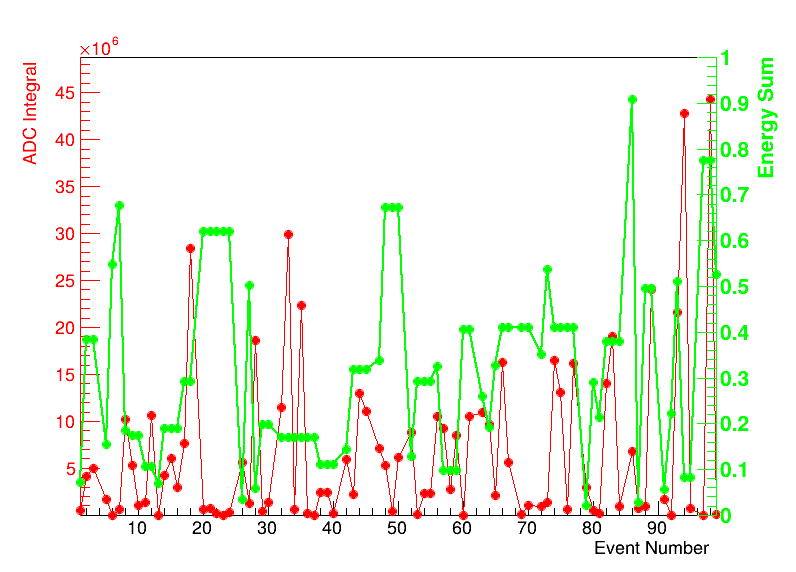

In [1]:
import ROOT
# Open the ROOT file
g = ROOT.TFile("~/Downloads/analysis_hist_1003MeV_pimu.root", "READ")
canvas = ROOT.TCanvas("canvas", "canvas", 1000, 600)
dir1 = g.Get("offlineTriggerTPCInfoDisplay")
tree = dir1.Get("TPTree")

file2 = ROOT.TFile("root_files/proto_hist_8July_1433_1003MeV_pimu.root", "READ")
dir2 = file2.Get("ana")
tree2 = dir2.Get("treeHNLsel")
branch_Mu = tree2.GetBranch("EMu")
branch_Pi = tree2.GetBranch("EPi")

# y axis : adc and energy sum  
# x axis : event number

sums = {}
for i in range(min(tree.GetEntries(), 265362)):  # Adjust the range as needed
    tree.GetEntry(i)
    event_number = getattr(tree, "Event")
    adc_value = getattr(tree, "ADC_integral")
    if event_number not in sums:
        sums[event_number] = 0
    sums[event_number] += adc_value

sums2 = {}
for i in range(min(tree2.GetEntries(), 265362)):  # Adjust the range as needed
    tree2.GetEntry(i)
    event_number = i
    muon_energy = getattr(tree2, "EMu")
    pion_energy = getattr(tree2, "EPi")
    if event_number not in sums2:
        sums2[event_number] = 0
    sums2[event_number] += muon_energy + pion_energy

common_events = set(sums.keys()).intersection(set(sums2.keys()))

# Now, plot the energy from hepmc file and adc integral from analysis file for the common events in just one graph
# They are not in range, so we need to scale them
# We will scale the energy sum to be in the same range as adc integral

canvas = ROOT.TCanvas("canvas", "Canvas with two y-axes", 800, 600)

# Create the individual graphs
graph1 = ROOT.TGraph()
graph2 = ROOT.TGraph()

# Add points to the graphs
for idx, event_number in enumerate(common_events):
    graph1.SetPoint(idx, event_number, sums[event_number])
    graph2.SetPoint(idx, event_number, sums2[event_number])


# Set marker styles and colors
graph1.SetMarkerStyle(20)
graph1.SetLineColor(2)
graph1.SetMarkerColor(2)
graph2.SetMarkerStyle(21)
graph2.SetLineColor(3)
graph2.SetMarkerColor(3)

# Draw the first graph
graph1.Draw("APL")

# Configure the primary y-axis
graph1.GetYaxis().SetTitle("ADC Integral")
graph1.GetYaxis().SetTitleColor(2)
graph1.GetYaxis().SetLabelColor(2)
graph1.GetYaxis().SetAxisColor(2)
graph1.GetXaxis().SetTitle("Event Number")

# Set the range of the x-axis to match the common events
graph1.GetXaxis().SetLimits(min(common_events), max(common_events))

# Update the canvas to draw the first graph
canvas.Modified()
canvas.Update()

# Create a secondary y-axis
right_axis = ROOT.TGaxis(ROOT.gPad.GetUxmax(), ROOT.gPad.GetUymin(),
                         ROOT.gPad.GetUxmax(), ROOT.gPad.GetUymax(),
                         0, 1,
                         510, "+L")
right_axis.SetTitle("Energy Sum")
right_axis.SetTitleColor(3)
right_axis.SetLabelColor(3)
right_axis.SetLineColor(3)
right_axis.SetTextColor(3)
right_axis.Draw()

print(f"Common events: {len(common_events)}")

# Scale the energy sum to match the range of the ADC integral
max_adc_sum = max(sums.values())
max_energy_sum = max(sums2.values())
scale_factor = max_adc_sum / max_energy_sum


for idx, event_number in enumerate(common_events):
    graph2.SetPoint(idx, event_number, sums2[event_number] * scale_factor)


graph2.SetTitle("ADC Integral and Energy Sum vs Event Number")
graph2.GetXaxis().SetTitle("Event Number")
graph2.GetYaxis().SetTitle("ADC Integral and Energy Sum")
graph2.SetMarkerStyle(20)
graph2.SetLineColor(3)
graph2.SetMarkerColor(3)
graph2.SetLineWidth(2)

#print scale factor
print(f"Scale factor: {scale_factor}")

#print the unscaled energy sum and scaled energy sum for the common events
for idx, event_number in enumerate(common_events):
    print(f"Event No: {event_number}, ADC sum: {sums[event_number]}, Energy sum: {sums2[event_number]}, Scaled Energy sum: {scale_factor*sums2[event_number]}")


graph2.Draw("PLSAME")

# Update the canvas
canvas.Modified()
canvas.Update()
canvas.Draw()


Event No: 0, dEdx: 2.67146438632894e-310
Event No: 1, dEdx: 0.002287826327704037
Event No: 2, dEdx: 0.0025078334150252833
Event No: 3, dEdx: 0.0025078334150252833
Event No: 4, dEdx: 0.0032364783671405507
Event No: 5, dEdx: 0.0032364783671405507
Event No: 6, dEdx: 0.002343000090174441
Event No: 7, dEdx: 0.002704177534084204
Event No: 8, dEdx: 0.003936050918861535
Event No: 9, dEdx: 0.00227287593134899
Event No: 10, dEdx: 0.00227287593134899
Event No: 11, dEdx: 0.0022113474243964375
Event No: 12, dEdx: 0.0022113474243964375
Event No: 13, dEdx: 0.002549891780297449
Event No: 14, dEdx: 0.002431017391517456
Event No: 15, dEdx: 0.002431017391517456
Event No: 16, dEdx: 0.002431017391517456
Event No: 17, dEdx: 0.00269194941170762
Event No: 18, dEdx: 0.00269194941170762
Event No: 19, dEdx: 0.0025101634561327823
Event No: 20, dEdx: 0.0021141225283891705
Event No: 21, dEdx: 0.0021141225283891705
Event No: 22, dEdx: 0.0021141225283891705
Event No: 23, dEdx: 0.0021141225283891705
Event No: 24, dEdx

Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas


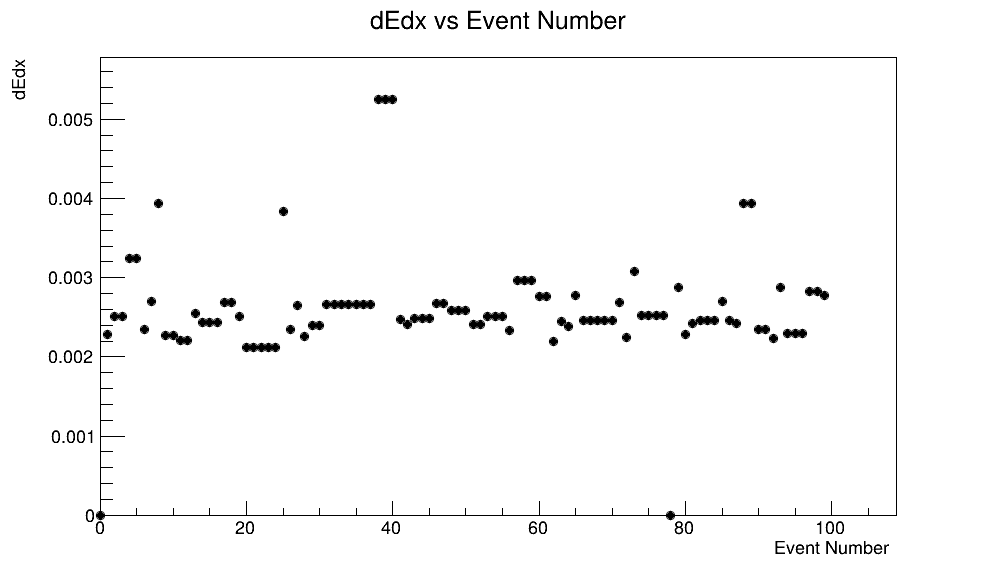

In [21]:
import ROOT
file2 = ROOT.TFile("root_files/proto_hist_8July_1433_1003MeV_pimu.root", "READ")
dir2 = file2.Get("ana")
tree2 = dir2.Get("treeHNLsel")
branch2 = tree2.GetBranch("dEdx")

#plot the dedex event by event
canvas = ROOT.TCanvas("canvas", "canvas", 1000, 600)

graph2 = ROOT.TGraph()

for i in range(min(tree2.GetEntries(), 265362)):  # Adjust the range as needed
    tree2.GetEntry(i)
    dedx = getattr(tree2, "dEdx")
    graph2.SetPoint(i, i, dedx)
    print(f"Event No: {i}, dEdx: {dedx}")

graph2.SetTitle("dEdx vs Event Number")
graph2.GetXaxis().SetTitle("Event Number")
graph2.GetYaxis().SetTitle("dEdx")
graph2.SetMarkerStyle(20)
graph2.SetLineColor(2)

graph2.Draw("AP")
canvas.Draw()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas
Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas


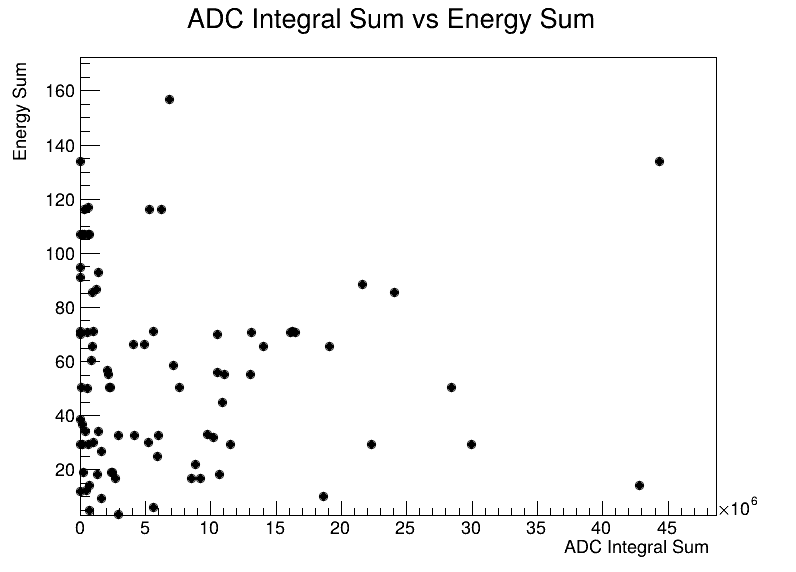

In [4]:
import ROOT
# Open the ROOT file
g = ROOT.TFile("~/Downloads/analysis_hist_1003MeV_pimu.root", "READ")
canvas = ROOT.TCanvas("canvas", "canvas", 1000, 600)
dir1 = g.Get("offlineTriggerTPCInfoDisplay")
tree = dir1.Get("TPTree")

file2 = ROOT.TFile("root_files/proto_hist_8July_1433_1003MeV_pimu.root", "READ")
dir2 = file2.Get("ana")
tree2 = dir2.Get("treeHNLsel")
branch_Mu = tree2.GetBranch("EMu")
branch_Pi = tree2.GetBranch("EPi")

# plot adc integral sum versus energy sum for the common events
sums = {}
for i in range(min(tree.GetEntries(), 265362)):  # Adjust the range as needed
    tree.GetEntry(i)
    event_number = getattr(tree, "Event")
    adc_value = getattr(tree, "ADC_integral")
    if event_number not in sums:
        sums[event_number] = 0
    sums[event_number] += adc_value

sums2 = {}
for i in range(min(tree2.GetEntries(), 265362)):  # Adjust the range as needed
    tree2.GetEntry(i)
    event_number = i
    muon_energy = getattr(tree2, "EMu")
    pion_energy = getattr(tree2, "EPi")
    if event_number not in sums2:
        sums2[event_number] = 0
    sums2[event_number] += muon_energy + pion_energy

common_events = set(sums.keys()).intersection(set(sums2.keys()))

canvas = ROOT.TCanvas("canvas", "Canvas with two y-axes", 800, 600)

# adc_sum versus energy_sum
graph1 = ROOT.TGraph()

for idx, event_number in enumerate(common_events):
    graph1.SetPoint(idx, sums[event_number], sums2[event_number])

graph1.SetTitle("ADC Integral Sum vs Energy Sum")
graph1.GetXaxis().SetTitle("ADC Integral Sum")
graph1.GetYaxis().SetTitle("Energy Sum")
graph1.SetMarkerStyle(20)
graph1.SetLineColor(2)

graph1.Draw("AP")
canvas.Draw()


Event No: 1, ADC sum: 504381, E_Mu: 5.777226824278673
Event No: 2, ADC sum: 4121733, E_Mu: 58.634007388617086
Event No: 3, ADC sum: 4956322, E_Mu: 58.634007388617086
Event No: 5, ADC sum: 1644327, E_Mu: 23.932836081970414
Event No: 6, ADC sum: 16676, E_Mu: 15.157848385468467
Event No: 7, ADC sum: 654329, E_Mu: 88.48044871225106
Event No: 8, ADC sum: 10184622, E_Mu: 14.60789822106678
Event No: 9, ADC sum: 5269354, E_Mu: 18.650607740694486
Event No: 10, ADC sum: 1000215, E_Mu: 18.650607740694486
Event No: 11, ADC sum: 1342327, E_Mu: 3.3760483914827155
Event No: 12, ADC sum: 10663006, E_Mu: 3.3760483914827155
Event No: 13, ADC sum: 4263, E_Mu: 7.254797989013962
Event No: 14, ADC sum: 4195237, E_Mu: 22.363770475761328
Event No: 15, ADC sum: 6029288, E_Mu: 22.363770475761328
Event No: 16, ADC sum: 2952090, E_Mu: 22.363770475761328
Event No: 17, ADC sum: 7619427, E_Mu: 8.355343203172092
Event No: 18, ADC sum: 28418845, E_Mu: 8.355343203172092
Event No: 20, ADC sum: 660695, E_Mu: 59.258128538

Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas
Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas


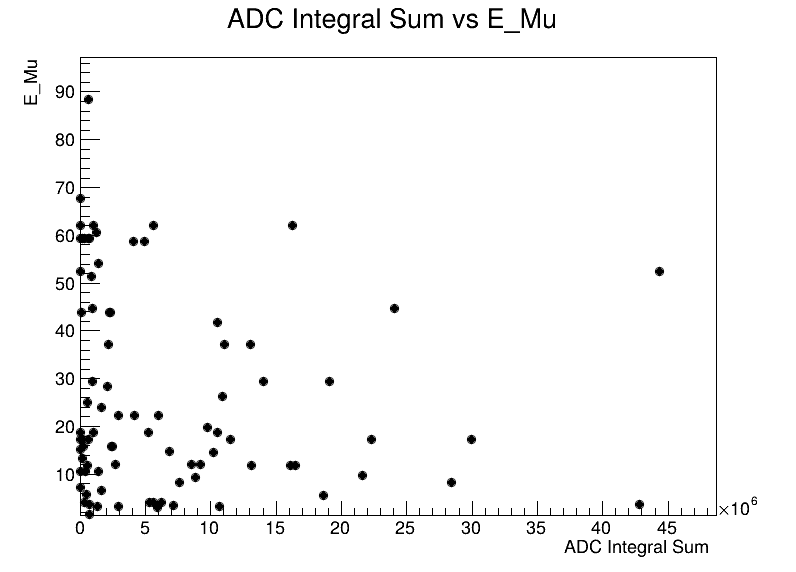

In [8]:
import ROOT
# Open the ROOT file
g = ROOT.TFile("~/Downloads/analysis_hist_1003MeV_pimu.root", "READ")
canvas = ROOT.TCanvas("canvas", "canvas", 1000, 600)
dir1 = g.Get("offlineTriggerTPCInfoDisplay")
tree = dir1.Get("TPTree")

file2 = ROOT.TFile("root_files/proto_hist_8July_1433_1003MeV_pimu.root", "READ")
dir2 = file2.Get("ana")
tree2 = dir2.Get("treeHNLsel")
branch_Mu = tree2.GetBranch("EMu")
branch_Pi = tree2.GetBranch("EPi")

# plot adc integral sum versus E_Mu for the common events
sums = {}
for i in range(min(tree.GetEntries(), 265362)):  # Adjust the range as needed
    tree.GetEntry(i)
    event_number = getattr(tree, "Event")
    adc_value = getattr(tree, "ADC_integral")
    if event_number not in sums:
        sums[event_number] = 0
    sums[event_number] += adc_value

# now list just the energy of the muon
Energy_muon_list = []
for i in range(min(tree2.GetEntries(), 265362)):  # Adjust the range as needed
    tree2.GetEntry(i)
    muon_energy = getattr(tree2, "EMu")
    Energy_muon_list.append(muon_energy)


common_events = set(sums.keys()).intersection(set(sums2.keys()))

canvas = ROOT.TCanvas("canvas", "Canvas with two y-axes", 800, 600)

# adc_sum versus E_Mu
graph1 = ROOT.TGraph()

for idx, event_number in enumerate(common_events):
    graph1.SetPoint(idx, sums[event_number], Energy_muon_list[event_number])

graph1.SetTitle("ADC Integral Sum vs E_Mu")
graph1.GetXaxis().SetTitle("ADC Integral Sum")
graph1.GetYaxis().SetTitle("E_Mu")
graph1.SetMarkerStyle(20)
graph1.SetLineColor(2)

graph1.Draw("AP")
canvas.Draw()
#print the adc integral sum and E_Mu for the common events
for idx, event_number in enumerate(common_events):
    print(f"Event No: {event_number}, ADC sum: {sums[event_number]}, E_Mu: {Energy_muon_list[event_number]}")

Warning in <TCanvas::Constructor>: Deleting canvas with same name: canvas


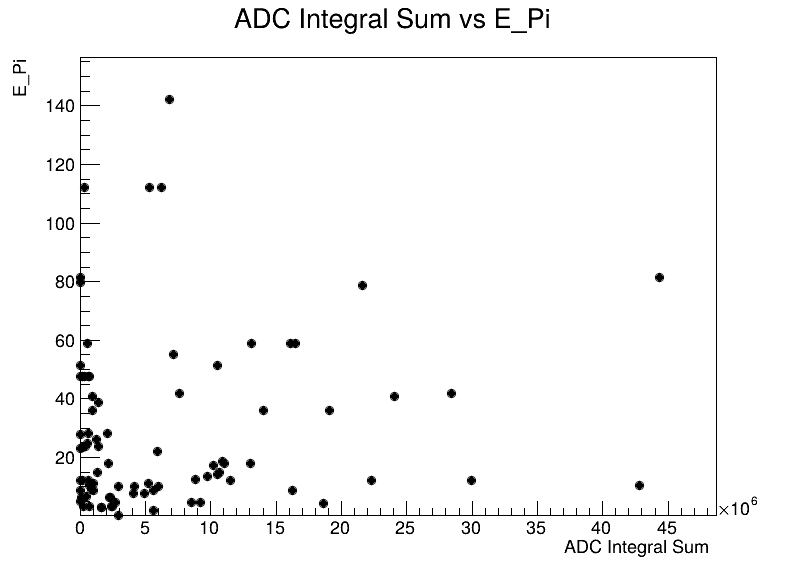

In [7]:
# adc sum versum E_Pi for the common events
sums = {}
for i in range(min(tree.GetEntries(), 265362)):  # Adjust the range as needed
    tree.GetEntry(i)
    event_number = getattr(tree, "Event")
    adc_value = getattr(tree, "ADC_integral")
    if event_number not in sums:
        sums[event_number] = 0
    sums[event_number] += adc_value

# now list just the energy of the pion
Energy_pion_list = []
for i in range(min(tree2.GetEntries(), 265362)):  # Adjust the range as needed
    tree2.GetEntry(i)
    pion_energy = getattr(tree2, "EPi")
    Energy_pion_list.append(pion_energy)


common_events = set(sums.keys()).intersection(set(sums2.keys()))

canvas = ROOT.TCanvas("canvas", "Canvas with two y-axes", 800, 600)

# adc_sum versus E_Pi
graph1 = ROOT.TGraph()

for idx, event_number in enumerate(common_events):
    graph1.SetPoint(idx, sums[event_number], Energy_pion_list[event_number])

graph1.SetTitle("ADC Integral Sum vs E_Pi")
graph1.GetXaxis().SetTitle("ADC Integral Sum")
graph1.GetYaxis().SetTitle("E_Pi")
graph1.SetMarkerStyle(20)
graph1.SetLineColor(2)

graph1.Draw("AP")
canvas.Draw()